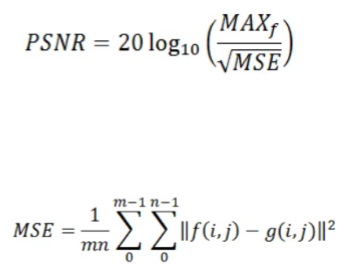

where,<br>
MAXf = maximum signal value that exists in our original image<br>
g = Ground truth image<br>
f = Noisy image<br>
m = no of rows of pixels and i represents the index of that row.<br>
n = no of columns of pixels and j represents the index of that column

#Dataset Overview


RENOIR Dataset :- A Dataset for Real Low-Light Image Noise Reduction.<br>
We will take 221 clean-noisy image pairs from this dataset 

In [1]:
!pip install patchify

In [2]:
#Importing relevant libraries
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from patchify import patchify, unpatchify
import seaborn as sns
import random
import numpy as np
import math
from sklearn.model_selection import train_test_split
import pickle
import tensorflow as tf
from tensorflow.keras.callbacks import LearningRateScheduler,ReduceLROnPlateau
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, Activation, Flatten, Dense, Input, MaxPooling2D, Add, Reshape, concatenate, AveragePooling2D, Multiply, GlobalAveragePooling2D, UpSampling2D, MaxPool2D,Softmax
from tensorflow.keras.activations import softmax
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.optimizers import Adam
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
%load_ext tensorboard

##Extracting Image paths for RENOIR Dataset

In [3]:
df = pd.DataFrame()
dir = os.listdir('/kaggle/input/renoir/GroundTruth')
GT = []
Nsy=[]
for image in dir:
  GT.append('/kaggle/input/renoir/GroundTruth/'+image)

dir = os.listdir('/kaggle/input/renoir/Noisy')
for image in dir:
  Nsy.append('/kaggle/input/renoir/Noisy/'+image)

df['Ground Truth Images'] = GT
df['Noisy Images'] = Nsy
df.head()

,Ground Truth Images,Noisy Images
0,/kaggle/input/renoir/GroundTruth/129.bmp,/kaggle/input/renoir/Noisy/129.bmp
1,/kaggle/input/renoir/GroundTruth/184.bmp,/kaggle/input/renoir/Noisy/184.bmp
2,/kaggle/input/renoir/GroundTruth/65.bmp,/kaggle/input/renoir/Noisy/65.bmp
3,/kaggle/input/renoir/GroundTruth/209.bmp,/kaggle/input/renoir/Noisy/209.bmp
4,/kaggle/input/renoir/GroundTruth/133.bmp,/kaggle/input/renoir/Noisy/133.bmp


In [4]:
df.shape

(221, 2)

#Exploratory Data Analysis

##Image Sizes

In [5]:
size=[]
for i in range(len(df)):
  img_gt = cv2.imread(df['Ground Truth Images'].iloc[i])
  size.append(img_gt.shape)

In [6]:
df['image size'] = size
df['image size'] = df['image size'].astype(str)
df.head()

,Ground Truth Images,Noisy Images,image size
0,/kaggle/input/renoir/GroundTruth/129.bmp,/kaggle/input/renoir/Noisy/129.bmp,"(2760, 3684, 3)"
1,/kaggle/input/renoir/GroundTruth/184.bmp,/kaggle/input/renoir/Noisy/184.bmp,"(3465, 5197, 3)"
2,/kaggle/input/renoir/GroundTruth/65.bmp,/kaggle/input/renoir/Noisy/65.bmp,"(3000, 3000, 3)"
3,/kaggle/input/renoir/GroundTruth/209.bmp,/kaggle/input/renoir/Noisy/209.bmp,"(3465, 5199, 3)"
4,/kaggle/input/renoir/GroundTruth/133.bmp,/kaggle/input/renoir/Noisy/133.bmp,"(2760, 3684, 3)"


Text(0, 0.5, 'No. of images')

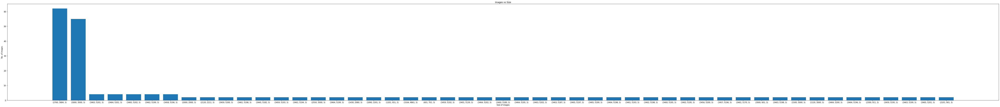

In [7]:
fig = plt.figure(figsize = (100, 10))
y = list(df['image size'].value_counts())
x = df['image size'].value_counts().index.tolist()
plt.bar(x,y)
plt.title("Images vs Size")
plt.xlabel("Size of images")
plt.ylabel("No. of images")

Observation : Most number of images have size (3024 x 4032).

##Displaying few clean-noisy image pairs

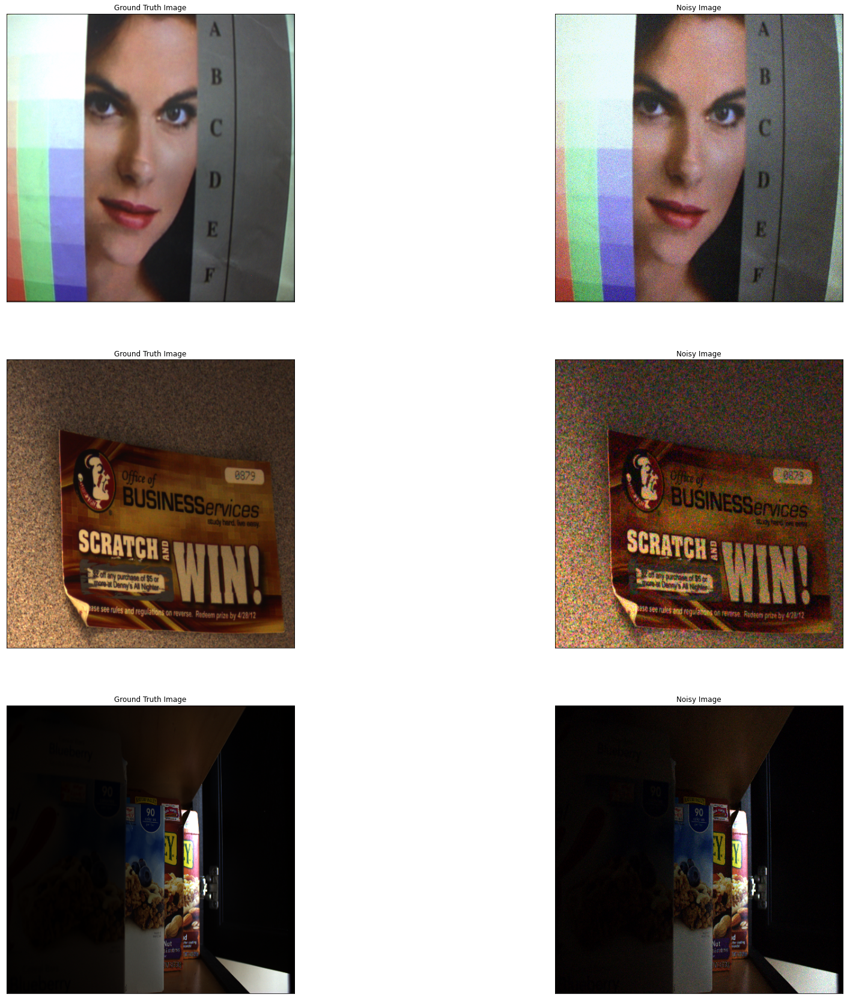

In [8]:
sample = df.sample(3)
fig, ax = plt.subplots(len(sample),2,figsize=(30,30))
for i in range(len(sample)):
  img = cv2.imread(sample['Ground Truth Images'].iloc[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img,(512,512))
  ax[i][0].imshow(img)
  ax[i][0].get_xaxis().set_visible(False)
  ax[i][0].get_yaxis().set_visible(False)
  ax[i][0].title.set_text("Ground Truth Image")
  
  img = cv2.imread(sample['Noisy Images'].iloc[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img,(512,512))
  ax[i][1].imshow(img)
  ax[i][1].get_xaxis().set_visible(False)
  ax[i][1].get_yaxis().set_visible(False)
  ax[i][1].title.set_text("Noisy Image")

Observation : One can see, there is significant amount of noise in the nosiy images and the ground truth images shows the corresponding clean images free from noise. <br>


##Splitting the dataset into train and test datasets

In [9]:
X = df['Noisy Images']
y = df['Ground Truth Images']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [10]:
#Storing the image patches as pickle files
import pickle
pickle.dump((X_train,y_train),open('train_path.pkl','wb'))
pickle.dump((X_test,y_test),open('test_path.pkl','wb'))

In [11]:
X_train, y_train = pickle.load(open('train_path.pkl', 'rb'))
X_test,y_test = pickle.load(open('test_path.pkl', 'rb'))

In [12]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(176,)
(176,)
(45,)
(45,)


##Creating Patches

In [13]:
def patches(img,patch_size):
  patches = patchify(img, (patch_size, patch_size, 3), step=patch_size)
  return patches

In [14]:
sample = pd.DataFrame({'Ground Truth Images':['a','/kaggle/input/renoir/GroundTruth/0.bmp'], 'Noisy Images':['b','/kaggle/input/renoir/Noisy/0.bmp']})
sample

,Ground Truth Images,Noisy Images
0,a,b
1,/kaggle/input/renoir/GroundTruth/0.bmp,/kaggle/input/renoir/Noisy/0.bmp


In [15]:
#Creating patches for a Ground Truth Image
path = sample['Ground Truth Images'].iloc[1]
img = cv2.imread(path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print('Image shape: {}'.format(img.shape))

patches_gt = patches(img,256)
print('Patch shape: {}'.format(patches_gt.shape))

Image shape: (3000, 3000, 3)
Patch shape: (11, 11, 1, 256, 256, 3)


In [16]:
#Creating patches for a Noisy Image
path = sample['Noisy Images'].iloc[1]
img = cv2.imread(path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print('Image shape: {}'.format(img.shape))

patches_nsy = patches(img,256)
print('Patch shape: {}'.format(patches_nsy.shape))

Image shape: (3000, 3000, 3)
Patch shape: (11, 11, 1, 256, 256, 3)


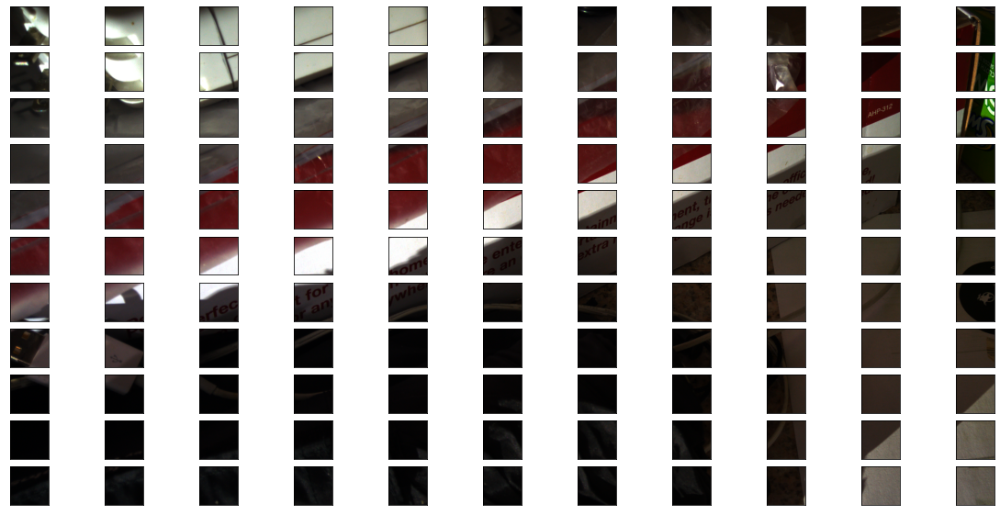

In [17]:
rows = patches_nsy.shape[0]
cols = patches_nsy.shape[1]
fig, axs = plt.subplots(rows,cols,figsize=(20,10))
for i in range(rows):
  for j in range(cols):
    axs[i][j].imshow(patches_gt[i][j][0])
    axs[i][j].get_xaxis().set_visible(False)
    axs[i][j].get_yaxis().set_visible(False)

This is what patches does. It splits the images into different patches based on a given patch size.

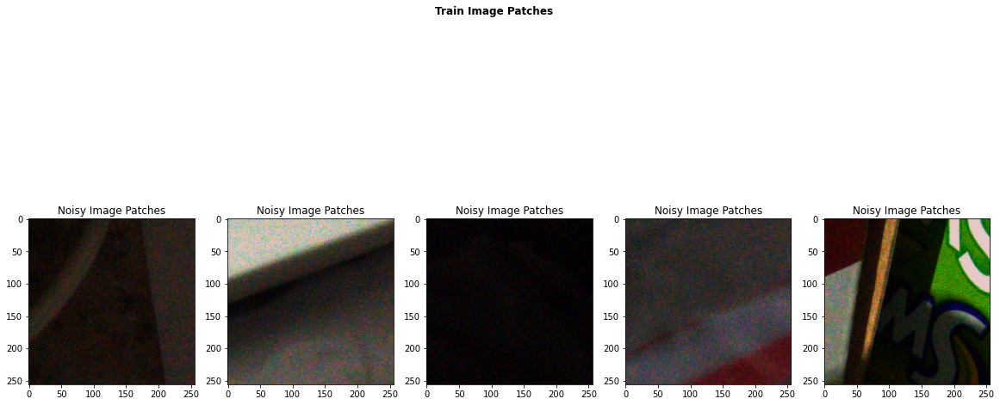

In [18]:
fig, axs = plt.subplots(1,5,figsize=(20,10))
r = random.sample(range(0, rows), 5)
c = random.sample(range(0, cols), 5)
fig.suptitle('Train Image Patches',fontweight ="bold")
for i in range(5):
  axs[i].imshow(patches_gt[r[i]][c[i]][0])
  axs[i].set_title('Ground Truth Image Patches')
  axs[i].imshow(patches_nsy[r[i]][c[i]][0])
  axs[i].set_title('Noisy Image Patches')


We can clearly see the difference between ground truth image patches and noisy image patches. There is significant amount on noisy in the noisy image patches and this is what we are trying to remove. <br>

We will be creating patches for all the images. Experiments have shown that splitting images into patches and using these patches for training improve model performance in denoising. In regard to that, we will resize all the images to a fixed size of 1024 x 1024 and create patches with patch size 256 x 256.

In [19]:
#Creating patches for X_train and y_train
X_train_patches = []
y_train_patches = []
for i in range(len(X_train)):
  path = X_train.iloc[i]
  img_nsy = cv2.imread(path)
  img_nsy = cv2.cvtColor(img_nsy, cv2.COLOR_BGR2RGB)
  img_nsy = cv2.resize(img_nsy,(1024,1024))  #resizing the X_train images
  patches_nsy = patches(img_nsy,256)
  
  path = y_train.iloc[i]
  img_gt = cv2.imread(path)
  img_gt = cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB)
  img_gt = cv2.resize(img_gt,(1024,1024))  #resizing the y_train images
  patches_gt = patches(img_gt,256)

  rows = patches_nsy.shape[0]
  cols = patches_nsy.shape[1]
  for j in range(rows):
    for k in range(cols):
      X_train_patches.append(patches_nsy[j][k][0])
      y_train_patches.append(patches_gt[j][k][0])
  
X_train = np.array(X_train_patches)
y_train = np.array(y_train_patches)

In [20]:
#Creating patches for X_test and y_test
X_test_patches = []
y_test_patches = []
for i in range(len(X_test)):
  path = X_test.iloc[i]
  img_nsy = cv2.imread(path)
  img_nsy = cv2.cvtColor(img_nsy, cv2.COLOR_BGR2RGB)
  img_nsy = cv2.resize(img_nsy,(1024,1024))  #resizing the X_test images
  patches_nsy = patches(img_nsy,256)
  
  path = y_test.iloc[i]
  img_gt = cv2.imread(path)
  img_gt = cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB)
  img_gt = cv2.resize(img_gt,(1024,1024))  #resizing the y_test images
  patches_gt = patches(img_gt,256)

  rows = patches_nsy.shape[0]
  cols = patches_nsy.shape[1]
  for j in range(rows):
    for k in range(cols):
      X_test_patches.append(patches_nsy[j][k][0])
      y_test_patches.append(patches_gt[j][k][0])

X_test = np.array(X_test_patches)
y_test = np.array(y_test_patches)

In [21]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(2816, 256, 256, 3)
(2816, 256, 256, 3)
(720, 256, 256, 3)
(720, 256, 256, 3)


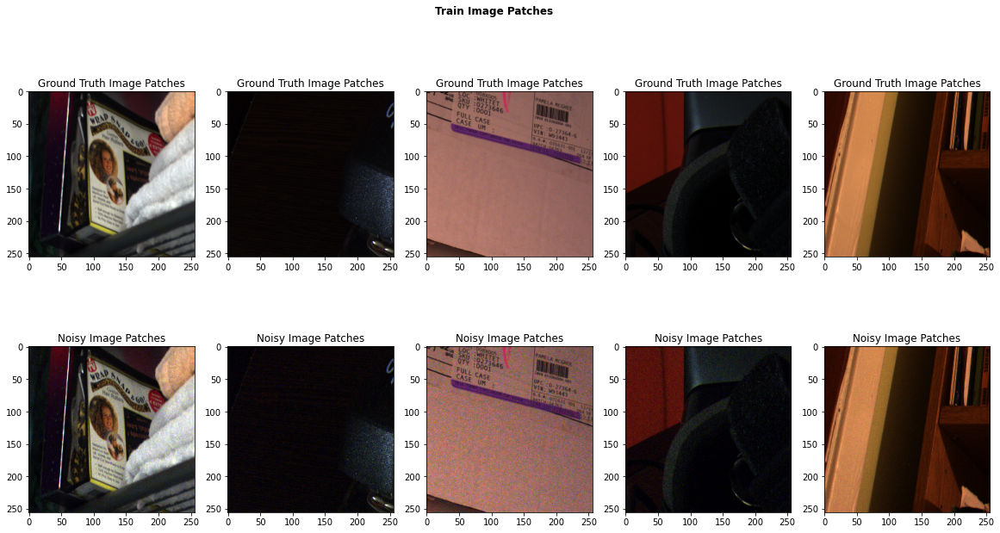

In [22]:
fig, axs = plt.subplots(2,5,figsize=(20,10))
r = random.sample(range(0, 2816), 5)

fig.suptitle('Train Image Patches',fontweight ="bold")
for i in range(5):
  axs[0][i].imshow(y_train[r[i]])
  axs[0][i].set_title('Ground Truth Image Patches')
  axs[1][i].imshow(X_train[r[i]])
  axs[1][i].set_title('Noisy Image Patches')

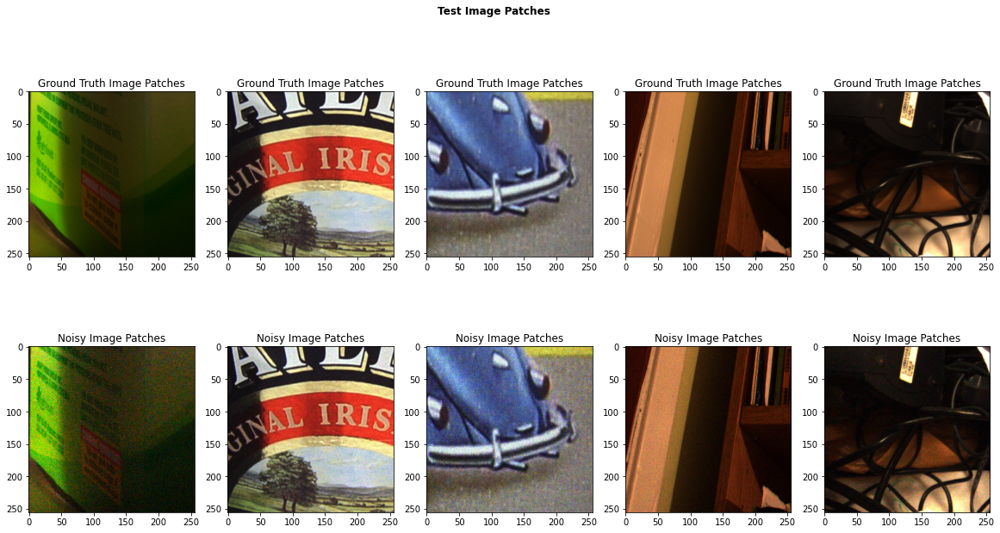

In [23]:
fig, axs = plt.subplots(2,5,figsize=(20,10))
r = random.sample(range(0, 720), 5)

fig.suptitle('Test Image Patches',fontweight ="bold")
for i in range(5):
  axs[0][i].imshow(y_test[r[i]])
  axs[0][i].set_title('Ground Truth Image Patches')
  axs[1][i].imshow(X_test[r[i]])
  axs[1][i].set_title('Noisy Image Patches')

In [24]:
print("Total number of image patches on train data : ", len(X_train))
print("Total number of image patches on test data : ", len(X_test))

Total number of image patches on train data :  2816
Total number of image patches on test data :  720


After creating image patches, there are a total of 2816 image patches in train dataset and 720 image patches in test dataset.

In [25]:
#Storing the image patches as pickle files
import pickle
pickle.dump((X_train,y_train),open('train_data.pkl','wb'))
pickle.dump((X_test,y_test),open('test_data.pkl','wb'))

In [26]:
X_train_patches, y_train_patches = pickle.load(open('train_data.pkl', 'rb'))
X_test_patches,y_test_patches = pickle.load(open('test_data.pkl', 'rb'))

In [27]:
print(X_train_patches.shape)
print(y_train_patches.shape)
print(X_test_patches.shape)
print(y_test_patches.shape)

(2816, 256, 256, 3)
(2816, 256, 256, 3)
(720, 256, 256, 3)
(720, 256, 256, 3)


In [28]:
#Normalizing the image pixels
X_train_patches = X_train_patches.astype("float32") / 255.0
y_train_patches = y_train_patches.astype("float32") / 255.0
X_test_patches = X_test_patches.astype("float32") / 255.0
y_test_patches = y_test_patches.astype("float32") / 255.0

In [29]:
class Dataloder(tf.keras.utils.Sequence):    
    def __init__(self, X,y,batch_size=1, shuffle=False):
        self.X = X
        self.y = y
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(X))

    def __getitem__(self, i):
        # collect batch data
        batch_x = self.X[i * self.batch_size : (i+1) * self.batch_size]
        batch_y = self.y[i * self.batch_size : (i+1) * self.batch_size]
        
        return tuple((batch_x,batch_y))
    
    def __len__(self):
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)

In [30]:
batch_size=32
train_dataloader = Dataloder(X_train_patches,y_train_patches, batch_size, shuffle=True)
test_dataloader = Dataloder(X_test_patches,y_test_patches,batch_size, shuffle=True)

In [31]:
train_dataloader[0][0].shape

(32, 256, 256, 3)

#Some plotting and prediction functions that can be used for all model

In [32]:
#Custom function to get denoised image prediction for noisy images
def prediction(img,model):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img,(1024,1024))
  img = img.astype("float32") / 255.0

  img_patches = patches(img,256)

  nsy=[]
  for i in range(4):
    for j in range(4):
      nsy.append(img_patches[i][j][0])
  nsy = np.array(nsy)

  pred_img = model.predict(nsy)
  pred_img = np.reshape(pred_img,(4,4,1,256,256,3))
  pred_img = unpatchify(pred_img, img.shape)
  return pred_img

In [33]:
#Custom function to get denoised image prediction for noisy images on quantized models using tflite
def prediction_tflite(img,model):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img,(1024,1024))
  img = img.astype("float32") / 255.0

  img_patches = patches(img,256)

  nsy=[]
  for i in range(4):
    for j in range(4):
      nsy.append(img_patches[i][j][0])
  nsy = np.array(nsy)
  pred=[]
  for patch in nsy:
    model.set_tensor(input_details[0]['index'], tf.expand_dims(patch,axis=0))
    model.invoke()
    tflite_model_predictions = model.get_tensor(output_details[0]['index'])
    pred.append(tflite_model_predictions)

  pred_img = np.reshape(pred,(4,4,1,256,256,3))
  pred_img = unpatchify(pred_img, img.shape)
  return pred_img

In [34]:
#Custom function to plot/visualize noisy, ground truth and predicted images
def visualize(sample,model):
  fig,ax = plt.subplots(len(sample),3,figsize=(30,30))
  for i in range(len(sample)):
    path = sample['Ground Truth Images'].iloc[i]
    test_img_gt = cv2.imread(path)
    test_img_gt = cv2.cvtColor(test_img_gt, cv2.COLOR_BGR2RGB)
    test_img_gt = cv2.resize(test_img_gt,(512,512))
    test_img_gt = test_img_gt.astype("float32") / 255.0
  
    path = sample['Noisy Images'].iloc[i]
    test_img_nsy = cv2.imread(path)
    pred_img = prediction(test_img_nsy,model)
    pred_img = cv2.resize(pred_img,(512,512))

    test_img_nsy = cv2.cvtColor(test_img_nsy, cv2.COLOR_BGR2RGB)
    test_img_nsy = cv2.resize(test_img_nsy,(512,512))
    test_img_nsy = test_img_nsy.astype("float32") / 255.0
    
    ax[i][0].imshow(test_img_nsy)
    ax[i][0].get_xaxis().set_visible(False)
    ax[i][0].get_yaxis().set_visible(False)
    ax[i][0].title.set_text("Noisy Image")

    ax[i][1].imshow(test_img_gt)
    ax[i][1].get_xaxis().set_visible(False)
    ax[i][1].get_yaxis().set_visible(False)
    ax[i][1].title.set_text("Ground Truth Image")

    ax[i][2].imshow(pred_img)
    ax[i][2].get_xaxis().set_visible(False)
    ax[i][2].get_yaxis().set_visible(False)
    ax[i][2].title.set_text("Predicted Image")

In [35]:
#Custom function that computes the psnr and ssim values for images
def psnr_and_ssim(X_test,y_test,model,model_type='Normal'):
  psnr_nsy = 0.0
  psnr_de_nsy = 0.0
  ssim_nsy = 0.0
  ssim_de_nsy = 0.0
  for i in range(len(X_test)):
    #getting the noisy images
    path = X_test.iloc[i]
    nsy = cv2.imread(path)  

    #getting the predicted images
    if model_type == 'Quantized': 
      pred = prediction_tflite(nsy,model)
    else:
      pred = prediction(nsy,model)

    #getting the ground truth images
    path = y_test.iloc[i]
    gt = cv2.imread(path)         
    gt = cv2.cvtColor(gt, cv2.COLOR_BGR2RGB)
    
    #Resizing the images
    gt = cv2.resize(gt,(1024,1024))
    nsy = cv2.resize(nsy,(1024,1024))

    #Normalizing the images
    gt = gt.astype("float32") / 255.0
    nsy = nsy.astype("float32") / 255.0

    #Computing psnr and ssim for test images
    psnr_nsy += psnr(gt,nsy)
    psnr_de_nsy += psnr(gt,pred)
    ssim_nsy += ssim(gt,nsy,multichannel=True,data_range=nsy.max() - nsy.min())
    ssim_de_nsy += ssim(gt,pred,multichannel=True,data_range=pred.max() - pred.min())

  psnr_nsy = psnr_nsy/len(X_test)
  psnr_de_nsy = psnr_de_nsy/len(X_test)
  ssim_nsy = ssim_nsy/len(X_test)
  ssim_de_nsy = ssim_de_nsy/len(X_test)
  return psnr_nsy, psnr_de_nsy,ssim_nsy,ssim_de_nsy

# CBDNet

In the original research paper, they trained this model using real images and sythetically added noisy images. They sythetically added noise to the images using a noise model. <br> Refer the research paper for detailed explanation: https://arxiv.org/pdf/1807.04686v2.pdf   <br>

Since, the dataset we are using already have clean-noisy image pairs, I didn't consider sythetically adding noise to the images. So, I haven't taken the noise creating model into consideration for building the network. 

The loss function used in the research paper for real noisy images is as shown below. <br>
**Loss = Mean Square Error (MSE) + (lambda x Total variation regularizer)**<br>
where total variation regularizer prevents oversmoothing of denoised images. 

Modifications done for CBDNet implementation compared to research paper :
1. Did not add synthetic noise to the image dataset since we have real-noisy image pairs.

2. Taken the loss function as mean squared error. 

In [36]:
#https://github.com/IDKiro/CBDNet-tensorflow/blob/dev/model.py
tf.keras.backend.clear_session()
input = Input(shape=(256, 256, 3))

#Noise estimation subnetwork
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(input)
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)
x = Conv2D(3, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)

#Non Blind denoising subnetwork
x = concatenate([x,input])
conv1 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)
conv2 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv1)

pool1 = AveragePooling2D(pool_size=(2,2),padding='same')(conv2)
conv3 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(pool1)
conv4 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv3)
conv5 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv4)

pool2 = AveragePooling2D(pool_size=(2,2),padding='same')(conv5)
conv6 = Conv2D(256, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(pool2)
conv7 = Conv2D(256, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv6)
conv8 = Conv2D(256, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv7)
conv9 = Conv2D(256, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv8)
conv10 = Conv2D(256, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv9)
conv11 = Conv2D(256, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv10)

upsample1 = Conv2DTranspose(128, (3, 3), strides=2, activation="relu", kernel_initializer='he_normal',padding="same")(conv11)
add1 = Add()([upsample1,conv5])
conv12 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(add1)
conv13 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv12)
conv14 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv13)

upsample2 = Conv2DTranspose(64, (3, 3), strides=2, activation="relu", kernel_initializer='he_normal',padding="same")(conv14)
add1 = Add()([upsample2,conv2])
conv15 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(add1)
conv16 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv15)

out = Conv2D(3, (1,1), kernel_initializer='he_normal',padding="same")(conv16)
out = Add()([out,input])

CBDNet = Model(input,out)
CBDNet.compile(optimizer=tf.keras.optimizers.Adam(1e-03), loss=tf.keras.losses.MeanSquaredError())
CBDNet.summary()

2023-01-26 06:54:25.810852: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-26 06:54:25.948554: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-26 06:54:25.949431: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-26 06:54:25.960260: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 32) 9248        conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 256, 256, 32) 9248        conv2d_1[0][0]                   
______________________________________________________________________________________________

In [37]:
log_dir="logs/model_2"
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True,write_grads=True)
reducelr = ReduceLROnPlateau(monitor='val_loss', factor=0.1,verbose=1,patience=4,min_delta=0.00001)
callback = [tensorboard,reducelr]
CBDNet.fit(train_dataloader,shuffle=True,epochs=30,validation_data= test_dataloader,callbacks=callback)

2023-01-26 06:54:29.512575: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2023-01-26 06:54:29.512612: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2023-01-26 06:54:29.518428: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1614] Profiler found 1 GPUs
2023-01-26 06:54:29.674078: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2023-01-26 06:54:29.674249: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1748] CUPTI activity buffer flushed
/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)
2023-01-26 06:54:30.234482: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/30


2023-01-26 06:54:32.502425: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


 1/88 [..............................] - ETA: 19:00 - loss: 0.1028

2023-01-26 06:54:43.438381: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2023-01-26 06:54:43.438423: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


 2/88 [..............................] - ETA: 1:18 - loss: 0.0805 

2023-01-26 06:54:44.535669: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2023-01-26 06:54:44.536630: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1748] CUPTI activity buffer flushed
2023-01-26 06:54:44.677652: I tensorflow/core/profiler/internal/gpu/cupti_collector.cc:673]  GpuTracer has collected 522 callback api events and 520 activity events. 
2023-01-26 06:54:44.696406: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2023-01-26 06:54:44.728348: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/model_2/train/plugins/profile/2023_01_26_06_54_44

2023-01-26 06:54:44.740567: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/model_2/train/plugins/profile/2023_01_26_06_54_44/8ce11a4c7ba2.trace.json.gz
2023-01-26 06:54:44.781361: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory:

88/88 [==============================] - 81s 775ms/step - loss: 0.0049 - val_loss: 0.0023


2023-01-26 06:55:51.004060: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 35389440 exceeds 10% of free system memory.
2023-01-26 06:55:51.039249: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 70778880 exceeds 10% of free system memory.
2023-01-26 06:55:51.093878: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 70778880 exceeds 10% of free system memory.
2023-01-26 06:55:51.150594: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 70778880 exceeds 10% of free system memory.
2023-01-26 06:55:51.206117: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 70778880 exceeds 10% of free system memory.


Epoch 2/30
88/88 [==============================] - 67s 763ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 3/30
88/88 [==============================] - 67s 767ms/step - loss: 0.0011 - val_loss: 8.6961e-04
Epoch 4/30
88/88 [==============================] - 67s 762ms/step - loss: 0.0011 - val_loss: 8.5916e-04
Epoch 5/30
88/88 [==============================] - 67s 763ms/step - loss: 8.9628e-04 - val_loss: 8.2106e-04
Epoch 6/30
88/88 [==============================] - 67s 762ms/step - loss: 8.4544e-04 - val_loss: 9.0641e-04
Epoch 7/30
88/88 [==============================] - 67s 767ms/step - loss: 8.0421e-04 - val_loss: 7.4380e-04
Epoch 8/30
88/88 [==============================] - 67s 762ms/step - loss: 7.9030e-04 - val_loss: 7.4274e-04
Epoch 9/30
88/88 [==============================] - 67s 763ms/step - loss: 9.7860e-04 - val_loss: 8.1123e-04
Epoch 10/30
88/88 [==============================] - 67s 762ms/step - loss: 7.9924e-04 - val_loss: 6.9155e-04
Epoch 11/30
88/88 [===============

In [38]:
%tensorboard --logdir "/content/logs/model_2"

In [39]:
CBDNet.save('CBDNet.h5')

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [40]:
CBDNet = tf.keras.models.load_model('/kaggle/working/CBDNet.h5')

In [41]:
sample = pd.DataFrame({'Ground Truth Images' :['/kaggle/input/renoir/GroundTruth/29.bmp','/kaggle/input/renoir/GroundTruth/84.bmp','/kaggle/input/renoir/GroundTruth/18.bmp'], "Noisy Images" : ['/kaggle/input/renoir/GroundTruth/29.bmp','/kaggle/input/renoir/GroundTruth/84.bmp','/kaggle/input/renoir/GroundTruth/18.bmp']})
sample

,Ground Truth Images,Noisy Images
0,/kaggle/input/renoir/GroundTruth/29.bmp,/kaggle/input/renoir/GroundTruth/29.bmp
1,/kaggle/input/renoir/GroundTruth/84.bmp,/kaggle/input/renoir/GroundTruth/84.bmp
2,/kaggle/input/renoir/GroundTruth/18.bmp,/kaggle/input/renoir/GroundTruth/18.bmp


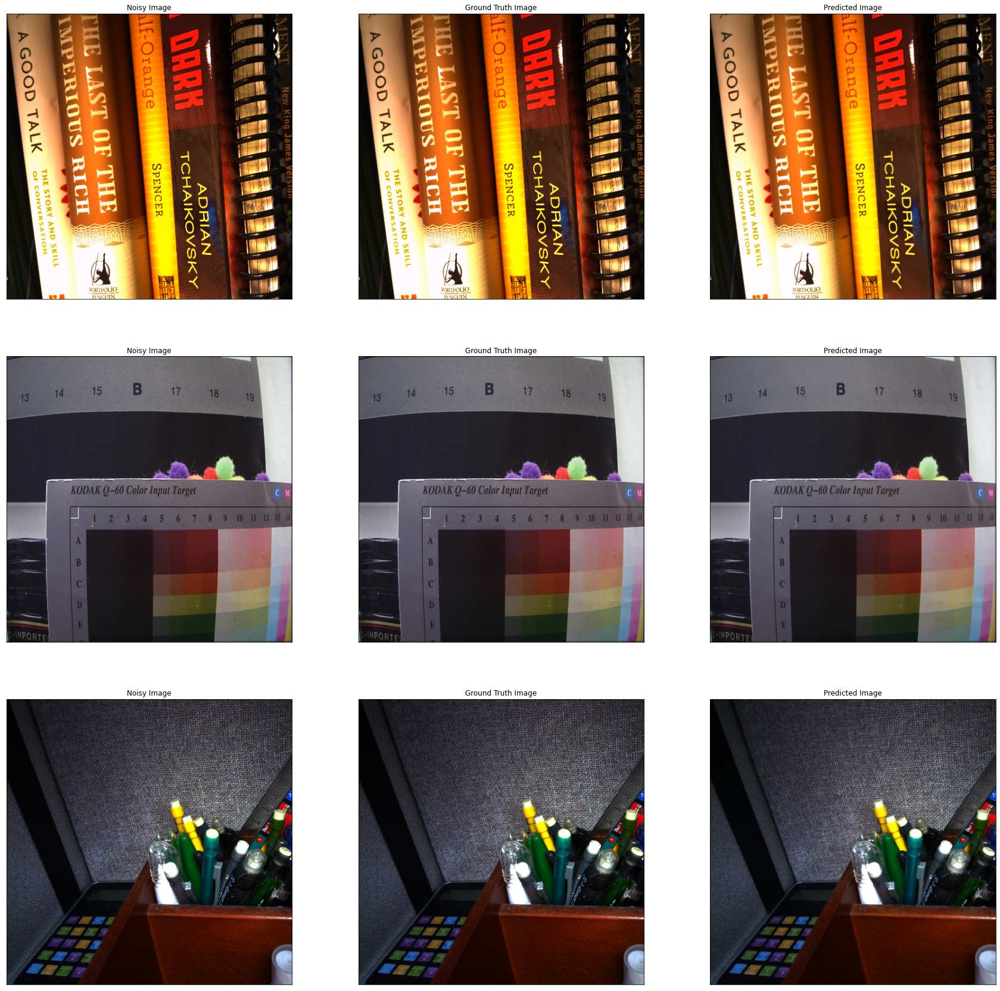

In [42]:
visualize(sample,CBDNet)

In [44]:
X_train, y_train = pickle.load(open('/kaggle/working/train_path.pkl', 'rb'))
X_test,y_test = pickle.load(open('/kaggle/working/test_path.pkl', 'rb'))

In [45]:
psnr_nsy, psnr_de_nsy, ssim_nsy, ssim_de_nsy = psnr_and_ssim(X_test,y_test,CBDNet)
print('PSNR before denoising :', psnr_nsy)
print('PSNR after denoising :', psnr_de_nsy)
print('SSIM before denoising :', ssim_nsy)
print('SSIM after denoising :', ssim_de_nsy)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:35: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.


PSNR before denoising : 18.023695075471387
PSNR after denoising : 33.57867052367326
SSIM before denoising : 0.45323650572035046
SSIM after denoising : 0.8585374606980218


In [46]:
model_size = round((os.stat('/content/CBDNet.h5').st_size)/(1024**2),3)
PSNR.append(round(psnr_de_nsy,3))
SSIM.append(round(ssim_de_nsy,3))
PSNR_imp.append(round(psnr_de_nsy-psnr_nsy,3))
SSIM_imp.append(round(ssim_de_nsy-ssim_nsy,3))
size.append(model_size)

FileNotFoundError: [Errno 2] No such file or directory: '/content/CBDNet.h5'